In [7]:
%load_ext autoreload
%autoreload 2

# 1. Diagnóstico de Cáncer de Mama

El conjunto de datos de este problema fue generado a partir de imágenes histopatológicas de biopsias mamarias. Se extrajeron variables morfológicas y moleculares de las
células,incluyendo tamaño, forma, densidadnuclear, tasa de mitosis y presencia de mutaciones. El objetivo espredecir el diagnósticodel tumor (benigno o maligno). Para una descripción más detallada del conjunto de datos, consulte cell_diagnosis_description.md.

# 1.1
Realizar un análisis exploratorio de los datos para visualizar la distribución de las variables e identificar valores faltantes, outliers y variables categóricas. Investigar los rangos posibles de cada feature y analizar su correlación con el target.

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType,GeneticMutation
0,63.423148,0.500594,1.473261,23.300222,NaN,0.477657,3.434832,2.492852,-10.000000,78.625935,5.727217,41.158399,0.0,Epthlial,Absnt
1,72.906362,0.474808,1.361360,21.336137,29.856233,0.481035,2.702433,2.281137,63.084699,NaN,5.319552,NaN,1.0,Epthlial,Presnt
2,70.711969,0.481701,NaN,21.521406,30.582427,0.472651,2.786606,2.318029,61.347022,NaN,NaN,NaN,1.0,???,Absnt
3,73.210206,NaN,1.427612,22.437077,29.887970,0.439511,2.998380,2.149232,64.047169,80.693058,NaN,37.843069,1.0,Mesnchymal,Presnt
4,68.348288,NaN,1.454116,21.150723,28.328197,NaN,2.987601,NaN,62.197197,81.737990,4.347438,43.444881,1.0,Epthlial,Presnt


Cantidad de nans por columna:


,Cantidad de NaNs
CellSize,330
CellShape,316
NucleusDensity,301
ChromatinTexture,297
CytoplasmSize,316
CellAdhesion,294
MitosisRate,320
NuclearMembrane,320
GrowthFactor,304
OxygenSaturation,288





Cantidad de outliers por columna:


,Cantidad de Outliers
CellSize,88
CellShape,87
NucleusDensity,115
ChromatinTexture,65
CytoplasmSize,61
CellAdhesion,84
MitosisRate,109
NuclearMembrane,78
GrowthFactor,94
OxygenSaturation,90





Variables categoricas:


,Variables Categóricas
0,CellType
1,GeneticMutation





Cantidad de valores unicos por columna:


,Cantidad de Valores Únicos
CellSize,1310
CellShape,1347
NucleusDensity,1333
ChromatinTexture,1366
CytoplasmSize,1347
CellAdhesion,1369
MitosisRate,1316
NuclearMembrane,1343
GrowthFactor,1332
OxygenSaturation,1346


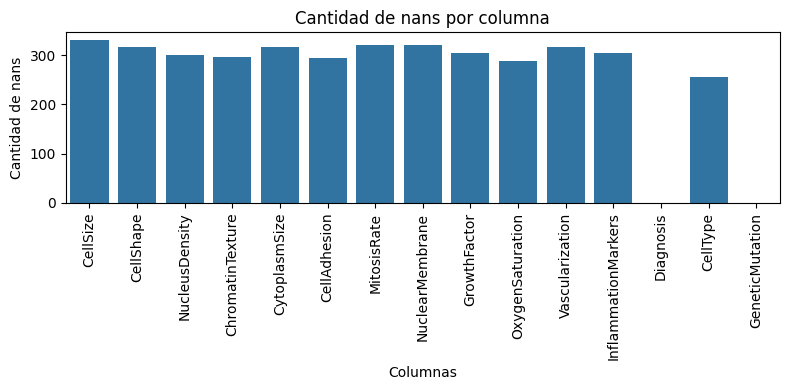

Rangos de cada feature numérica:


,min,max
CellSize,-100.000000,1000.000000
CellShape,-1.413038,5.048566
NucleusDensity,-3.000000,50.000000
ChromatinTexture,10.000000,263.793425
CytoplasmSize,5.000000,299.350559
CellAdhesion,-4.461755,5.029925
MitosisRate,-50.000000,100.000000
NuclearMembrane,-3.438990,24.871762
GrowthFactor,-50.000000,563.622684
OxygenSaturation,-10.000000,807.181058


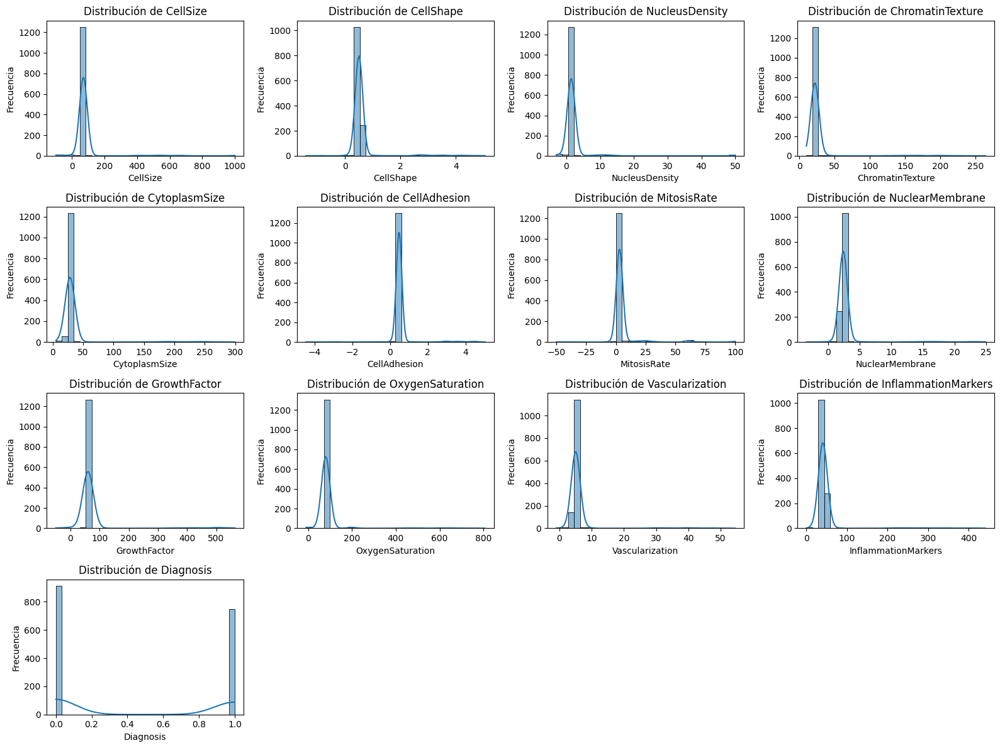

Correlación de cada feature numérica con el target (Diagnosis):


,Correlación
Diagnosis,1.000000
CytoplasmSize,0.070458
GrowthFactor,0.065615
CellSize,0.063615
OxygenSaturation,0.023743
CellShape,0.019966
Vascularization,0.005502
NucleusDensity,-0.001480
ChromatinTexture,-0.005549
CellAdhesion,-0.011341


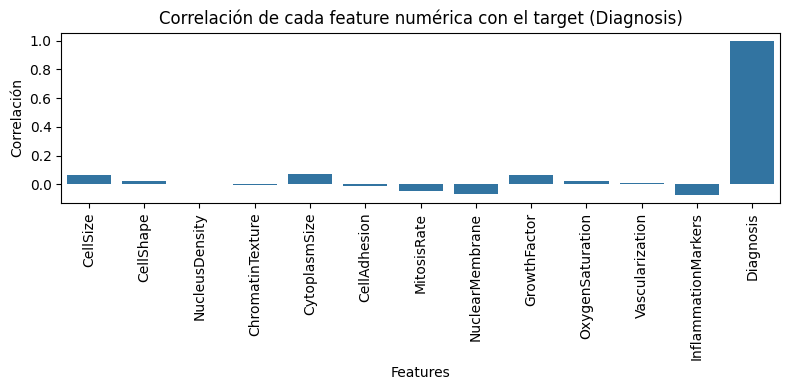

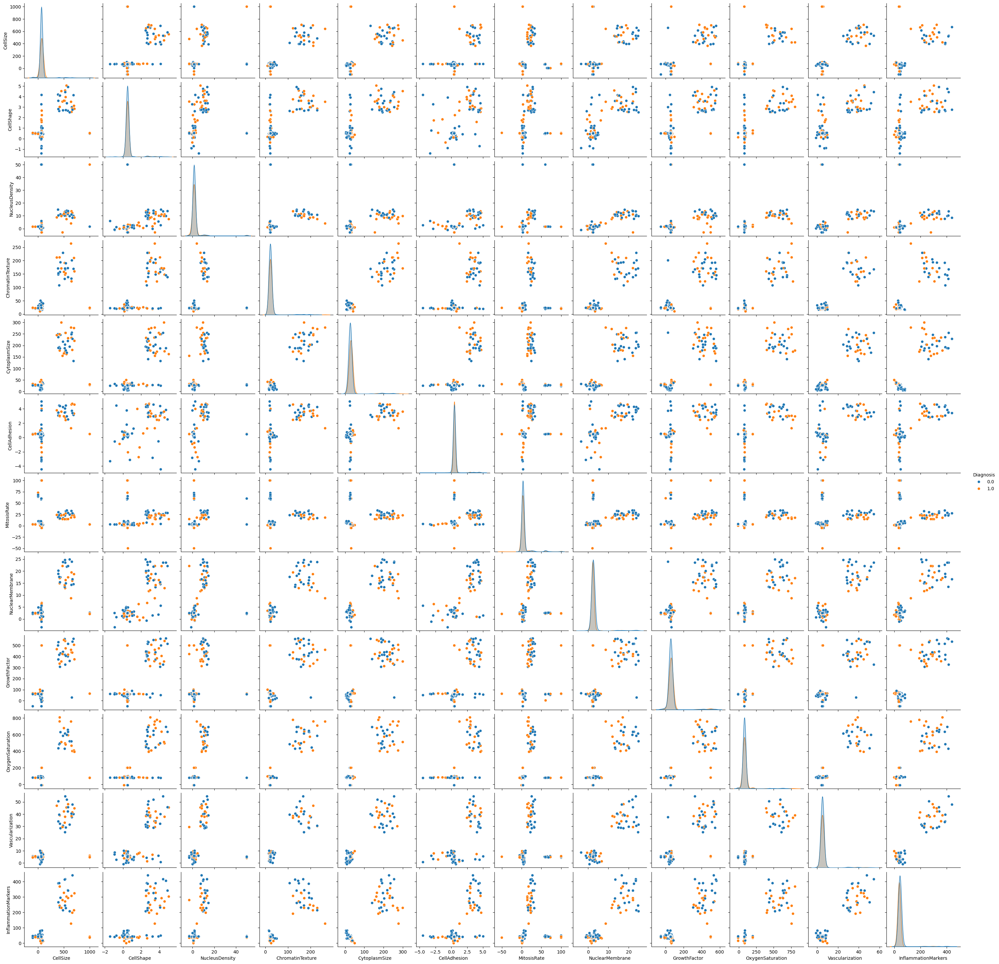

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
import sys
sys.path.append('../src')
from data_splitting import *
from preprocessing import *
from models import *
from metrics import *
from utils import *

TARGET = 'Diagnosis'
SEED = 42


df = pd.read_csv('../data/raw/cell_diagnosis_dev.csv')

display(df.head())

# 1. NaNs per column
nan_counts = df.isna().sum()
print("Cantidad de nans por columna:")
display(nan_counts.to_frame(name="Cantidad de NaNs"))
print("\n\n")

# 2. Outliers per column
outlier_counts = df.select_dtypes(include=[np.number]).apply(count_outliers)

print("Cantidad de outliers por columna:")
display(outlier_counts.to_frame(name="Cantidad de Outliers"))
print("\n\n")

# 3. Categorical variables
categorical_columns = df.select_dtypes(include=['object', 'bool']).columns
print("Variables categoricas:")
display(pd.DataFrame(categorical_columns, columns=["Variables Categóricas"]))
print("\n\n")

# 4. Number of unique values ​​per column
unique_counts = df.nunique()
print("Cantidad de valores unicos por columna:")
display(unique_counts.to_frame(name="Cantidad de Valores Únicos"))
print("\n\n")

# 5. NaNs per column plot
plt.figure(figsize=(8, 4))
sns.barplot(x=nan_counts.index, y=nan_counts.values)
plt.xticks(rotation=90)
plt.title('Cantidad de nans por columna')
plt.xlabel('Columnas')
plt.ylabel('Cantidad de nans')
plt.tight_layout()
plt.show()


# 6. Ranges of each numeric feature
numeric_features = df.select_dtypes(include=[np.number])
feature_ranges = numeric_features.agg(['min', 'max']).T
print("Rangos de cada feature numérica:")
display(feature_ranges)
print("\n\n")

# 7. Distribution of each numeric feature
plt.figure(figsize=(16, 12))
for i, column in enumerate(numeric_features.columns, 1):
    plt.subplot(4, 4, i)
    sns.histplot(df[column], kde=True, bins=30)
    plt.title(f'Distribución de {column}')
    plt.xlabel(column)
    plt.ylabel('Frecuencia')
plt.tight_layout()
plt.show()

# 8. Correlation with the target variable (diagnosis)
if 'Diagnosis' in df.columns:
    if df['Diagnosis'].dtype == 'object':
        df['Diagnosis'] = df['Diagnosis'].astype('category').cat.codes
    
    correlations = numeric_features.corrwith(df['Diagnosis'])
    print("Correlación de cada feature numérica con el target (Diagnosis):")
    display(correlations.to_frame(name="Correlación").sort_values(by="Correlación", ascending=False))
    
    plt.figure(figsize=(8, 4))
    sns.barplot(x=correlations.index, y=correlations.values)
    plt.xticks(rotation=90)
    plt.title('Correlación de cada feature numérica con el target (Diagnosis)')
    plt.xlabel('Features')
    plt.ylabel('Correlación')
    plt.tight_layout()
    plt.show()
else:
    print("El target 'Diagnosis' no está presente en el DataFrame.")

sns.pairplot(df, diag_kind='kde', hue=TARGET)


{'CellSize': (np.float64(55.6), np.float64(80.1)),
 'CellShape': (np.float64(0.4), np.float64(0.59)),
 'NucleusDensity': (np.float64(1.25), np.float64(1.59)),
 'ChromatinTexture': (np.float64(18.61), np.float64(25.21)),
 'CytoplasmSize': (np.float64(19.51), np.float64(35.68)),
 'CellAdhesion': (np.float64(0.38), np.float64(0.55)),
 'MitosisRate': (np.float64(1.78), np.float64(4.09)),
 'NuclearMembrane': (np.float64(1.72), np.float64(2.93)),
 'GrowthFactor': (np.float64(50.43), np.float64(69.91)),
 'OxygenSaturation': (np.float64(75.58), np.float64(83.53)),
 'Vascularization': (np.float64(3.83), np.float64(6.14)),
 'InflammationMarkers': (np.float64(29.23), np.float64(51.47))}

,CellSize,CellShape,NucleusDensity,ChromatinTexture,CytoplasmSize,CellAdhesion,MitosisRate,NuclearMembrane,GrowthFactor,OxygenSaturation,Vascularization,InflammationMarkers,Diagnosis,CellType_Epthlial,CellType_Mesnchymal,GeneticMutation_Presnt
0,-1.841506,0.046374,0.692766,1.323485,-0.952645,0.118864,1.153824,0.706114,-0.264449,-1.227711,2.020661,0.162917,0.0,True,False,False
1,0.963245,-0.941928,-1.557264,-0.688019,0.670280,0.266560,-1.184030,-0.653641,0.925820,0.323254,0.811398,-0.523218,1.0,True,False,True
2,0.314233,-0.677744,-0.721823,-0.498277,0.995688,-0.100021,-0.915346,-0.416701,0.297215,-0.048478,-0.167597,-0.682561,1.0,False,False,False
3,1.053110,0.471225,-0.225109,0.439501,0.684502,-1.548908,-0.239354,-1.500814,1.273994,0.661805,0.096131,-0.721405,1.0,False,True,True
4,-0.384849,0.058618,0.307809,-0.877910,-0.014433,0.037610,-0.273758,-0.535844,0.604766,1.616956,-2.072199,0.772807,1.0,True,False,True



Cantidad de nans por columna:


,Cantidad de NaNs
CellSize,0
CellShape,0
NucleusDensity,0
ChromatinTexture,0
CytoplasmSize,0
CellAdhesion,0
MitosisRate,0
NuclearMembrane,0
GrowthFactor,0
OxygenSaturation,0


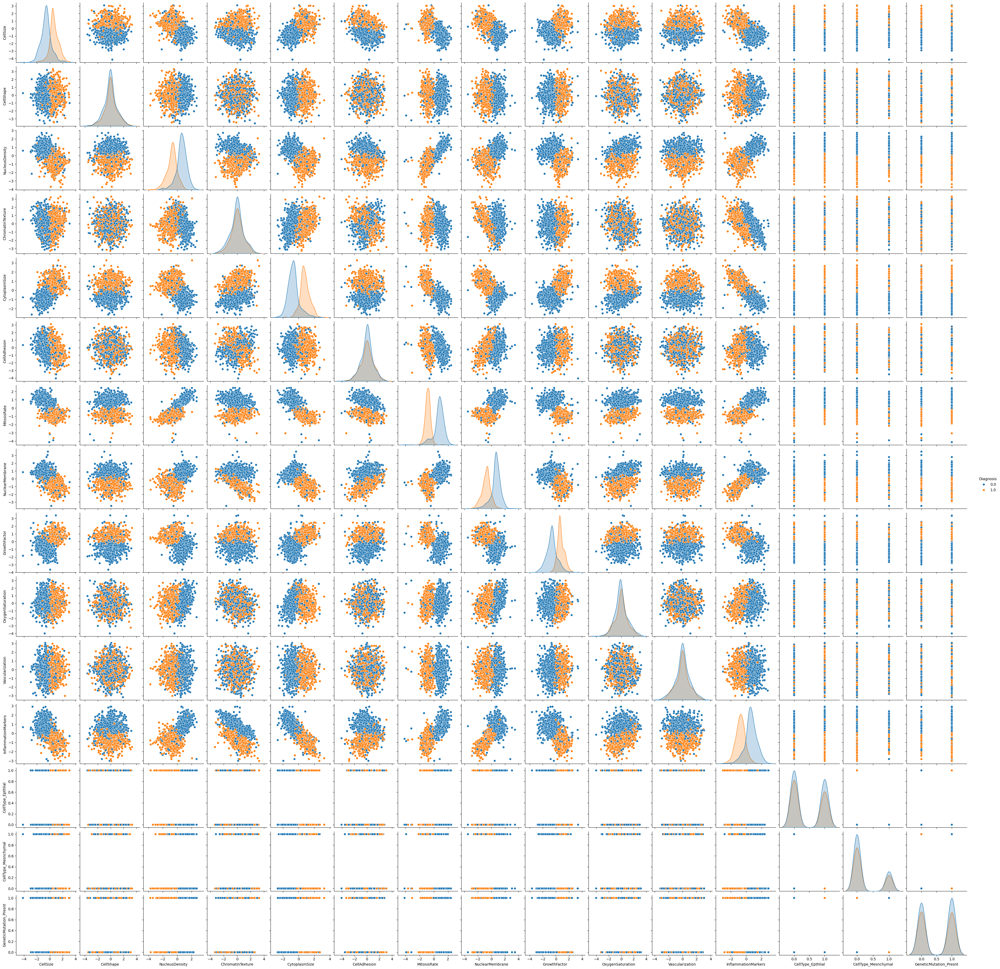

In [2]:
feature_ranges = get_feature_ranges(df, numeric_features.drop(columns=[TARGET]), q1=0.1259, q3=0.6672)
display(feature_ranges)

df = process_data(df, categorical_columns, feature_ranges=feature_ranges)

df.to_csv('../data/processed/cell_diagnosis_dev_processed.csv', index=False)
display(df.head())

nan_counts = df.isna().sum()
print("\nCantidad de nans por columna:")
display(nan_counts.to_frame(name="Cantidad de NaNs"))
print("\n\n")
sns.pairplot(df, diag_kind='kde', hue=TARGET)


# 1.2
Implementar una clase de regresión logística binaria con regularización L2. Utilizando el conjunto de datos de desarrollo cell_diagnosis_balanced_dev.csv, dividir los datos en 80% entrenamiento y 20% validación Entrenar el modelo sobre el conjunto de entrenamiento y evaluar su desempeño sobre el conjunto de validación. Reportar las siguientes métricas de performance:

– Matriz de confusión
– Accuracy
– Precision
– Recall
– F-Score
– Curva Precision-Recall (PR)
– Curva ROC
– AUC-ROC
– AUC-PR

Para ajustar el hiperparámetro de regularización λ, puede utilizar F-Score como métrica de performance.

**NOTA**: Si el modelo se implementa de forma general para clasificación multiclase, el mismo código podrá ser reutilizado en el ejercicio 2.

{'CellSize': (np.float64(55.6), np.float64(80.1)),
 'CellShape': (np.float64(0.4), np.float64(0.59)),
 'NucleusDensity': (np.float64(1.25), np.float64(1.63)),
 'ChromatinTexture': (np.float64(18.61), np.float64(25.21)),
 'CytoplasmSize': (np.float64(18.79), np.float64(37.61)),
 'CellAdhesion': (np.float64(0.38), np.float64(0.55)),
 'MitosisRate': (np.float64(1.71), np.float64(4.31)),
 'NuclearMembrane': (np.float64(1.72), np.float64(3.02)),
 'GrowthFactor': (np.float64(50.43), np.float64(69.91)),
 'OxygenSaturation': (np.float64(75.58), np.float64(84.15)),
 'Vascularization': (np.float64(3.83), np.float64(6.33)),
 'InflammationMarkers': (np.float64(29.23), np.float64(51.47))}


Buscando hiperparámetros con un solo barrido:
Mejor lambda: 0.0001
Mejor F1-score: 0.9301


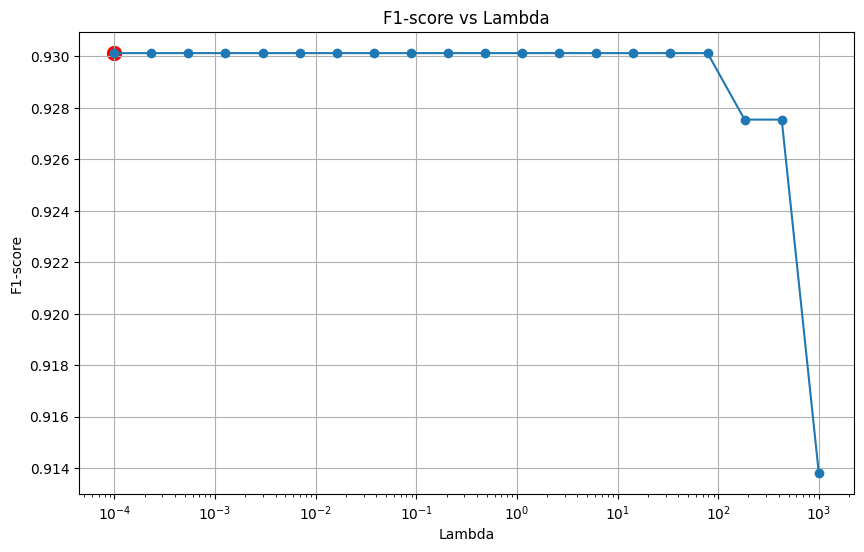

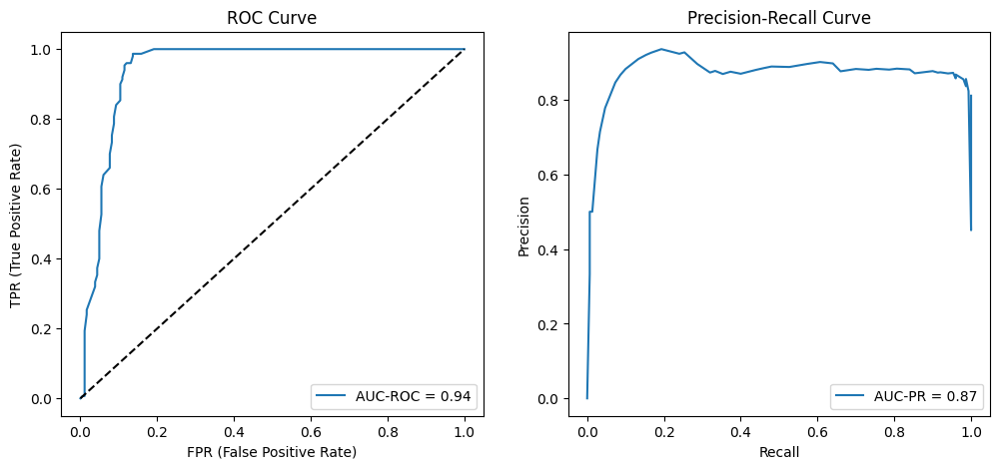

****Evaluación en Validation****
Matriz de confusión:
 [[158  25]
 [  0 150]]
✔ Accuracy: 0.92
✔ Precision: 0.93
✔ Recall: 0.93
✔ F1-score: 0.93
✔ AUC-ROC: 0.94
✔ AUC-PR: 0.87

Buscando hiperparámetros con find_best_lambda:
Primer barrido: Mejor lambda: 0.0001 con F1-score: 0.9301
Segundo mejor lambda: 0.00023357214690901214 con F1-score: 0.9301
Barrido fino: Mejor lambda: 0.0001 con F1-score: 0.9301
Mejor lambda: 0.0001
Mejor F1-score: 0.9301


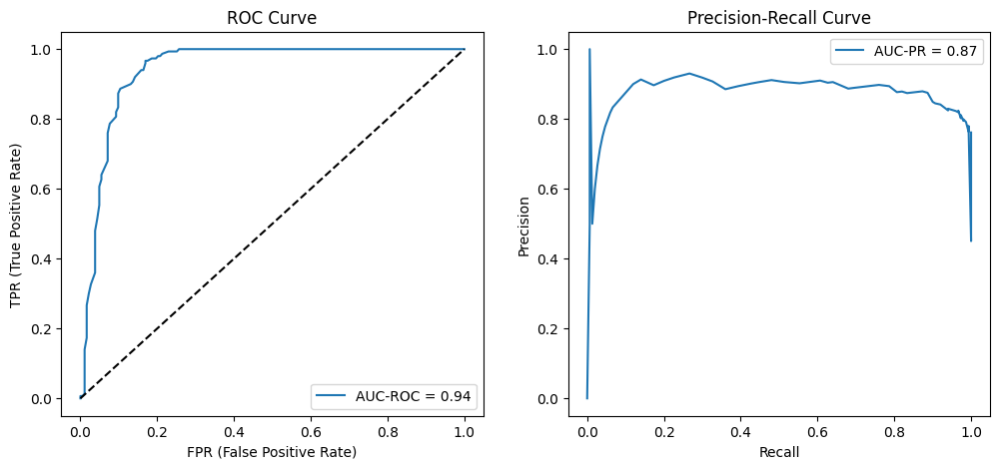

****Evaluación en Validation****
Matriz de confusión:
 [[158  25]
 [  0 150]]
✔ Accuracy: 0.92
✔ Precision: 0.93
✔ Recall: 0.93
✔ F1-score: 0.93
✔ AUC-ROC: 0.94
✔ AUC-PR: 0.87

Buscando hiperparámetros con cross validation:
Lambda 0.00010 - F1: 0.9107
Lambda 0.00023 - F1: 0.9107
Lambda 0.00055 - F1: 0.9107
Lambda 0.00127 - F1: 0.9100
Lambda 0.00298 - F1: 0.9107
Lambda 0.00695 - F1: 0.9100
Lambda 0.01624 - F1: 0.9100
Lambda 0.03793 - F1: 0.9100
Lambda 0.08859 - F1: 0.9100
Lambda 0.20691 - F1: 0.9100
Lambda 0.48329 - F1: 0.9100
Lambda 1.12884 - F1: 0.9100
Lambda 2.63665 - F1: 0.9102
Lambda 6.15848 - F1: 0.9107
Lambda 14.38450 - F1: 0.9100
Lambda 33.59818 - F1: 0.9102
Lambda 78.47600 - F1: 0.9112
Lambda 183.29807 - F1: 0.9090
Lambda 428.13324 - F1: 0.9081
Lambda 1000.00000 - F1: 0.9052
Mejor lambda: 78.47599703514607 con F1-score: 0.9112
Mejor lambda: 78.47599703514607
Mejor F1-score: 0.9112


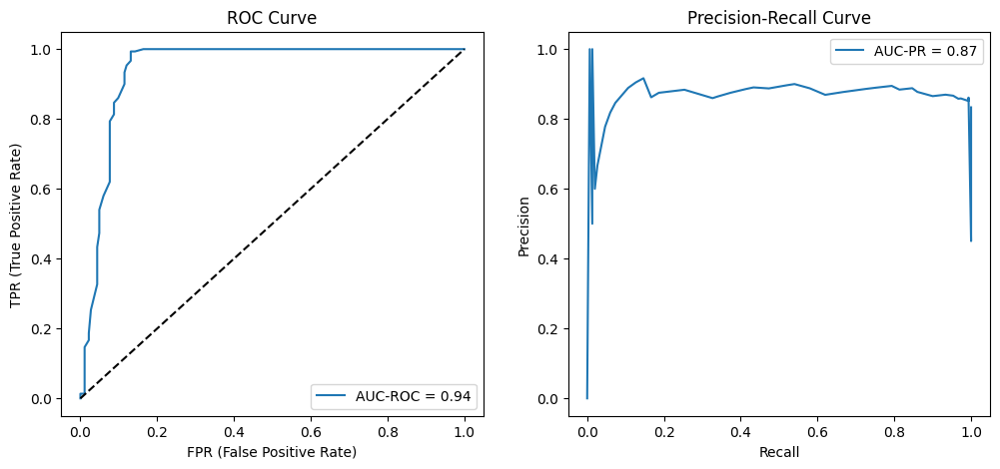

****Evaluación en Validation****
Matriz de confusión:
 [[158  25]
 [  0 150]]
✔ Accuracy: 0.92
✔ Precision: 0.93
✔ Recall: 0.93
✔ F1-score: 0.93
✔ AUC-ROC: 0.94
✔ AUC-PR: 0.87


In [3]:
df = pd.read_csv('../data/raw/cell_diagnosis_dev.csv')

train_df, val_df = train_val_split_df(df, val_size=0.2, seed=SEED)
numeric_features = train_df.select_dtypes(include=[np.number])

feature_ranges = get_feature_ranges(train_df, numeric_features.drop(columns=[TARGET]), q1=0.1449, q3=0.7336)
display(feature_ranges)

train_df_imputed, val_df_imputed = process_data(train_df, categorical_columns, val_df=val_df, feature_ranges=feature_ranges)
train_df_imputed.to_csv('../data/processed/cell_diagnosis_train_processed.csv', index=False)
val_df_imputed.to_csv('../data/processed/cell_diagnosis_val_processed.csv', index=False)

features = ['CellSize', 'CellShape', 'NucleusDensity', 'ChromatinTexture', 'CytoplasmSize', 'CellAdhesion', 'MitosisRate', 'NuclearMembrane', 'GrowthFactor', 'OxygenSaturation', 'Vascularization', 'InflammationMarkers']

X_train, y_train = prepare_data(train_df_imputed, features, TARGET)
X_val, y_val = prepare_data(val_df_imputed, features, TARGET)

lambdas = np.logspace(-4, 3, 20)


print("\nBuscando hiperparámetros con un solo barrido:")
f1_scores = []
best_lambda = None
best_f1 = -1
for lmb in lambdas:
    model = LogisticRegressionL2(lambda_=lmb)
    model.fit(X_train, y_train)
    y_probs = model.predict_proba(X_val)
    y_pred = np.argmax(y_probs, axis=1)
    f1 = f1_score(y_val, y_pred)
    f1_scores.append(f1)
    if f1 > best_f1:
        best_f1 = f1
        best_lambda = lmb

print(f"Mejor lambda: {best_lambda}")
print(f"Mejor F1-score: {best_f1:.4f}")

# F1-score vs Lambda
plt.figure(figsize=(10, 6))
plt.plot(lambdas, f1_scores, marker='o')
plt.scatter([best_lambda], [best_f1], color='red', s=100, label='Mejor lambda')
plt.xscale('log')
plt.xlabel('Lambda')
plt.ylabel('F1-score')
plt.title('F1-score vs Lambda')
plt.grid()
plt.show()

model_best_lambda = LogisticRegressionL2(lambda_=best_lambda)
model_best_lambda.fit(X_train, y_train)
evaluate_classification_performance(X_val, y_val, model_best_lambda)


print("\nBuscando hiperparámetros con find_best_lambda:")
find_best_lambda_model, best_lambda_find, find_best_f1 = find_best_lambda(X_train, y_train, X_val, y_val, lambdas)
print(f"Mejor lambda: {best_lambda_find}")
print(f"Mejor F1-score: {find_best_f1:.4f}")
evaluate_classification_performance(X_val, y_val, find_best_lambda_model)


print("\nBuscando hiperparámetros con cross validation:")
cross_model, cross_lambda, cross_f1 = cross_val_f1_score_df(df, lambdas, features, TARGET, categorical_columns, numeric_features.drop(columns=[TARGET]), q1=0.1449, q3=0.7336, k=5, seed=SEED)
print(f"Mejor lambda: {cross_lambda}")
print(f"Mejor F1-score: {cross_f1:.4f}")
evaluate_classification_performance(X_val, y_val, cross_model)

# 1.3
Utilizando el conjunto de datos de test cell_diagnosis_balanced_test.csv, evalúe la performance del modelo desarrollado anteriormente computando las métricas de performance indicadas en el inciso 1.2.

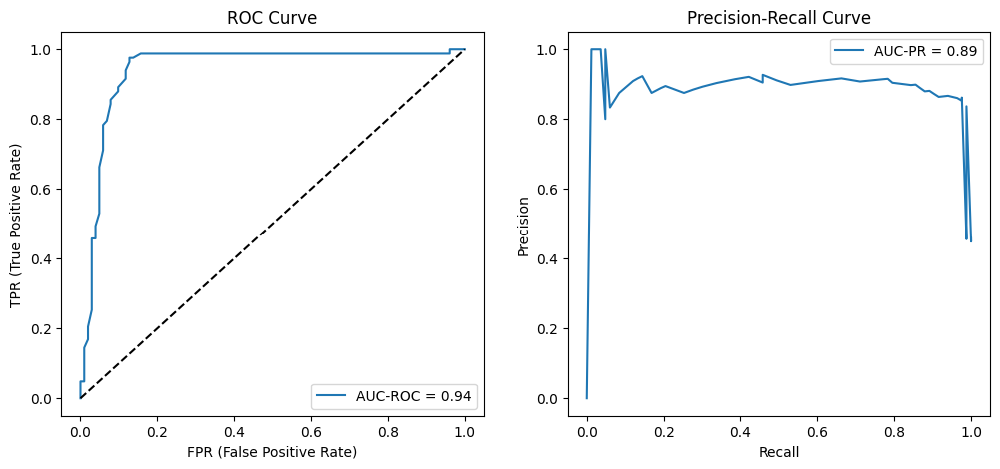

****Evaluación en Test****
Matriz de confusión:
 [[88 14]
 [ 2 81]]
✔ Accuracy: 0.91
✔ Precision: 0.92
✔ Recall: 0.92
✔ F1-score: 0.92
✔ AUC-ROC: 0.94
✔ AUC-PR: 0.89


In [4]:
test_df = pd.read_csv('../data/raw/cell_diagnosis_test.csv')

_, test_df_imputed = process_data(train_df, categorical_columns, val_df=test_df, feature_ranges=feature_ranges)
X_test, y_test = prepare_data(test_df_imputed, features, TARGET)
evaluate_classification_performance(X_test, y_test, model_best_lambda, set_name='Test')

# 1.4 Rebalanceo de Clases en Conjuntos Desbalanceados
Utilizando el conjunto de datos de desarrollo cell_diagnosis_imbalanced_dev.csv, dividir los datos en 80% entrenamiento y 20% validación. Entrenar distintos modelos de regresión logística binaria con regularización L2, aplicando una técnica de re-balanceo distinta en cada caso:

1) Sin rebalanceo: entrenar el modelo directamente sobre los datos desbalanceados.

2) Undersampling: eliminar muestras de la clase mayoritaria de manera aleatoria hasta que ambas clases tengan igual proporción.

3) Oversampling mediante duplicación: duplicar muestras de la clase minoritaria de manera aleatoria, hasta que que ambas clases tengan igual proporción.

4) Oversampling mediante SMOTE (Synthetic Minority Oversampling Technique): hasta que ambas clases tengan igual proporción.

5) Cost re-weighting: en la función de costo, multiplicar los terminos que dependen de las muestras de la clase minoritaria por un factor C=π2π1 , donde π1 es la probabilidad a-priori de la clase minoritoria y π2 el de la clase mayoritaria. Esto efectivamente re-balancea la importancia de tener errores de clasificacion de ambas clases.

Evalúe el desempeño de cada modelo sobre el conjunto de validación utilizando las métricas indicadas en el inciso 1.2. Para las curvas PR y ROC, grafique las curvas de cada modelo sobre el mismo grafico, de manera de poder comparar las características de cada uno. Para las metricas de performance escalares, ponga los resultados de cada modelo en una sola tabla, como se muestra a continuación:

Para ajustar el hiperparámetro de regularización puede utilizar F-Score como métrica de performance.

{'CellSize': (np.float64(55.6), np.float64(79.93)),
 'CellShape': (np.float64(0.4), np.float64(0.59)),
 'NucleusDensity': (np.float64(1.29), np.float64(1.63)),
 'ChromatinTexture': (np.float64(18.94), np.float64(25.21)),
 'CytoplasmSize': (np.float64(22.41), np.float64(34.4)),
 'CellAdhesion': (np.float64(0.39), np.float64(0.55)),
 'MitosisRate': (np.float64(1.78), np.float64(4.09)),
 'NuclearMembrane': (np.float64(1.84), np.float64(2.86)),
 'GrowthFactor': (np.float64(50.43), np.float64(69.91)),
 'OxygenSaturation': (np.float64(76.42), np.float64(84.03)),
 'Vascularization': (np.float64(3.98), np.float64(6.28)),
 'InflammationMarkers': (np.float64(29.23), np.float64(54.16))}


SIN REBALANCEO


UNDERSAMPLING

Primer barrido: Mejor lambda: 0.0001 con F1-score: 0.8463
Segundo mejor lambda: 0.000545559478116852 con F1-score: 0.8463
Barrido fino: Mejor lambda: 0.0001 con F1-score: 0.8463

OVERSAMPLING DUPLICACION

Primer barrido: Mejor lambda: 0.0001 con F1-score: 0.8434
Segundo mejor lambda: 0.002976351441631319 con F1-score: 0.8434
Barrido fino: Mejor lambda: 0.0001 con F1-score: 0.8434

OVERSAMPLING SMOTE

Primer barrido: Mejor lambda: 0.0001 con F1-score: 0.8185
Segundo mejor lambda: 0.00023357214690901214 con F1-score: 0.8185
Barrido fino: Mejor lambda: 0.0001890480979393414 con F1-score: 0.8211

COST RE-WEIGHTING

Primer barrido: Mejor lambda: 0.0001 con F1-score: 0.8173
Segundo mejor lambda: 0.0012742749857031334 con F1-score: 0.8123
Barrido fino: Mejor lambda: 0.0002304749984114593 con F1-score: 0.8542


,Modelo,Accuracy,Precision,Recall,F-Score,AUC-ROC,AUC-PR
0,Sin Rebalanceo,0.864754,0.810825,0.887372,0.847373,0.932405,0.683177
1,Undersampling,0.844262,0.800000,0.898396,0.846348,0.939816,0.713915
2,Oversampling Duplicación,0.840164,0.796875,0.895722,0.843412,0.931419,0.696720
3,Oversampling SMOTE,0.807377,0.774038,0.874332,0.821134,0.927854,0.676565
4,Cost Re-weighting,0.868852,0.815984,0.896144,0.854188,0.934515,0.671941


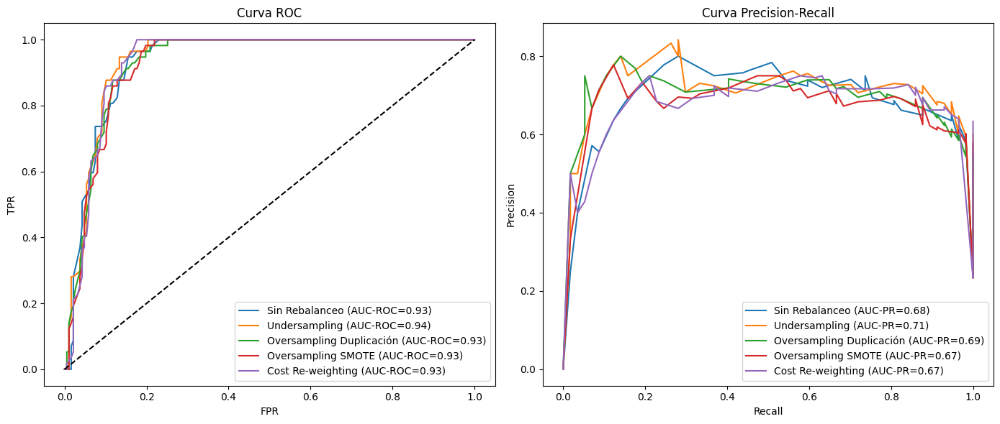

In [5]:
df_imb = pd.read_csv('../data/raw/cell_diagnosis_dev_imbalanced.csv')
train_df_imb, val_df_imb = train_val_split_df(df_imb, val_size=0.2, seed=SEED)
feature_ranges = get_feature_ranges(train_df_imb, numeric_features.drop(columns=[TARGET]), q1=0.1544, q3=0.7146)
display(feature_ranges)


# 1)
print("\nSIN REBALANCEO\n")
train_df_imb_imputed, val_df_imb_imputed = process_data(train_df_imb, categorical_columns, val_df=val_df_imb, feature_ranges=feature_ranges)

train_df_imb_imputed.to_csv('../data/processed/cell_diagnosis_train_imbalanced_processed.csv', index=False)
val_df_imb_imputed.to_csv('../data/processed/cell_diagnosis_val_imbalanced_processed.csv', index=False)

X_train_imp, y_train_imp = prepare_data(train_df_imb_imputed, features, TARGET)
X_val_imp, y_val_imp = prepare_data(val_df_imb_imputed, features, TARGET)

model_imb_1 = LogisticRegressionL2(lambda_=best_lambda)
model_imb_1.fit(X_train_imp, y_train_imp)


# 2) undersampling
print("\nUNDERSAMPLING\n")
X_train_balanced, y_train_balanced = undersampling(X_train_imp, y_train_imp)
model_imb_2, best_lambda_2, best_f1_2 = find_best_lambda(X_train_balanced, y_train_balanced, X_val_imp, y_val_imp, lambdas)


# 3) oversampling duplication
print("\nOVERSAMPLING DUPLICACION\n")
X_train_balanced, y_train_balanced = oversampling_duplicate(X_train_imp, y_train_imp)
model_imb_3, best_lambda_3, best_f1_3 = find_best_lambda(X_train_balanced, y_train_balanced, X_val_imp, y_val_imp, lambdas)


# 4) oversampling SMOTE
print("\nOVERSAMPLING SMOTE\n")
X_train_balanced, y_train_balanced = oversampling_smote(X_train_imp, y_train_imp)
model_imb_4, best_lambda_4, best_f1_4 = find_best_lambda(X_train_balanced, y_train_balanced, X_val_imp, y_val_imp, lambdas)


# 5) Cost re-weighting
print("\nCOST RE-WEIGHTING\n")
# Calculate the a-priori probabilities of each class
class_counts = pd.Series(y_train_imp).value_counts(normalize=True)
class_probs = class_counts / len(y_train_imp)
# Calculate the class weights
class_weights = {0: class_probs[1] / class_probs[0], 1: 1.0}
model_imb_5, best_lambda_5, best_f1_5 = find_best_lambda(X_train_imp, y_train_imp, X_val_imp, y_val_imp, lambdas, class_weights=class_weights)



metrics = pd.DataFrame({
    "Modelo": ["Sin Rebalanceo", "Undersampling", "Oversampling Duplicación", "Oversampling SMOTE", "Cost Re-weighting"],
    "Accuracy": [
        accuracy(y_val_imp, model_imb_1.predict(X_val_imp)),
        accuracy(y_val_imp, model_imb_2.predict(X_val_imp)),
        accuracy(y_val_imp, model_imb_3.predict(X_val_imp)),
        accuracy(y_val_imp, model_imb_4.predict(X_val_imp)),
        accuracy(y_val_imp, model_imb_5.predict(X_val_imp))
    ],
    "Precision": [
        precision(y_val_imp, model_imb_1.predict(X_val_imp)),
        precision(y_val_imp, model_imb_2.predict(X_val_imp)),
        precision(y_val_imp, model_imb_3.predict(X_val_imp)),
        precision(y_val_imp, model_imb_4.predict(X_val_imp)),
        precision(y_val_imp, model_imb_5.predict(X_val_imp))
    ],
    "Recall": [
        recall(y_val_imp, model_imb_1.predict(X_val_imp)),
        recall(y_val_imp, model_imb_2.predict(X_val_imp)),
        recall(y_val_imp, model_imb_3.predict(X_val_imp)),
        recall(y_val_imp, model_imb_4.predict(X_val_imp)),
        recall(y_val_imp, model_imb_5.predict(X_val_imp))
    ],
    "F-Score": [
        f1_score(y_val_imp, model_imb_1.predict(X_val_imp)),
        f1_score(y_val_imp, model_imb_2.predict(X_val_imp)),
        f1_score(y_val_imp, model_imb_3.predict(X_val_imp)),
        f1_score(y_val_imp, model_imb_4.predict(X_val_imp)),
        f1_score(y_val_imp, model_imb_5.predict(X_val_imp))
    ],
    "AUC-ROC": [
        auc_roc(y_val_imp, model_imb_1.predict_proba(X_val_imp)[:, 1]),
        auc_roc(y_val_imp, model_imb_2.predict_proba(X_val_imp)[:, 1]),
        auc_roc(y_val_imp, model_imb_3.predict_proba(X_val_imp)[:, 1]),
        auc_roc(y_val_imp, model_imb_4.predict_proba(X_val_imp)[:, 1]),
        auc_roc(y_val_imp, model_imb_5.predict_proba(X_val_imp)[:, 1])
    ],
    "AUC-PR": [
        auc_pr(y_val_imp, model_imb_1.predict_proba(X_val_imp)[:, 1]),
        auc_pr(y_val_imp, model_imb_2.predict_proba(X_val_imp)[:, 1]),
        auc_pr(y_val_imp, model_imb_3.predict_proba(X_val_imp)[:, 1]),
        auc_pr(y_val_imp, model_imb_4.predict_proba(X_val_imp)[:, 1]),
        auc_pr(y_val_imp, model_imb_5.predict_proba(X_val_imp)[:, 1])
    ]
})

display(metrics)


probs_1 = model_imb_1.predict_proba(X_val_imp)[:, 1]
probs_2 = model_imb_2.predict_proba(X_val_imp)[:, 1]
probs_3 = model_imb_3.predict_proba(X_val_imp)[:, 1]
probs_4 = model_imb_4.predict_proba(X_val_imp)[:, 1]
probs_5 = model_imb_5.predict_proba(X_val_imp)[:, 1]

model_names = [
    "Sin Rebalanceo", 
    "Undersampling", 
    "Oversampling Duplicación",
    "Oversampling SMOTE", 
    "Cost Re-weighting"
]

plot_multiple_curves(y_val_imp, 
                     [probs_1, probs_2, probs_3, probs_4, probs_5], 
                     model_names)

# 1.5
Utilizando el conjunto de datos de test cell_diagnosis_imbalanced_test.csv evalue la performance de cada uno de los modelos desarrollados anteriormente computando las métricas del inciso 1.4.

In [6]:
test_df_imb = pd.read_csv('../data/raw/cell_diagnosis_test_imbalanced.csv')
_, test_df_imputed_imb = process_data(train_df_imb, categorical_columns, val_df=test_df_imb, feature_ranges=feature_ranges)
X_test_imb, y_test_imb = prepare_data(test_df_imputed_imb, features, TARGET)


metrics = pd.DataFrame({
    "Modelo": ["Sin Rebalanceo", "Undersampling", "Oversampling Duplicación", "Oversampling SMOTE", "Cost Re-weighting"],
    "Accuracy": [
        accuracy(y_test_imb, model_imb_1.predict(X_test_imb)),
        accuracy(y_test_imb, model_imb_2.predict(X_test_imb)),
        accuracy(y_test_imb, model_imb_3.predict(X_test_imb)),
        accuracy(y_test_imb, model_imb_4.predict(X_test_imb)),
        accuracy(y_test_imb, model_imb_5.predict(X_test_imb))
    ],
    "Precision": [
        precision(y_test_imb, model_imb_1.predict(X_test_imb)),
        precision(y_test_imb, model_imb_2.predict(X_test_imb)),
        precision(y_test_imb, model_imb_3.predict(X_test_imb)),
        precision(y_test_imb, model_imb_4.predict(X_test_imb)),
        precision(y_test_imb, model_imb_5.predict(X_test_imb))
    ],
    "Recall": [
        recall(y_test_imb, model_imb_1.predict(X_test_imb)),
        recall(y_test_imb, model_imb_2.predict(X_test_imb)),
        recall(y_test_imb, model_imb_3.predict(X_test_imb)),
        recall(y_test_imb, model_imb_4.predict(X_test_imb)),
        recall(y_test_imb, model_imb_5.predict(X_test_imb))
    ],
    "F-Score": [
        f1_score(y_test_imb, model_imb_1.predict(X_test_imb)),
        f1_score(y_test_imb, model_imb_2.predict(X_test_imb)),
        f1_score(y_test_imb, model_imb_3.predict(X_test_imb)),
        f1_score(y_test_imb, model_imb_4.predict(X_test_imb)),
        f1_score(y_test_imb, model_imb_5.predict(X_test_imb))
    ],
    "AUC-ROC": [
        auc_roc(y_test_imb, model_imb_1.predict_proba(X_test_imb)[:, 1]),
        auc_roc(y_test_imb, model_imb_2.predict_proba(X_test_imb)[:, 1]),
        auc_roc(y_test_imb, model_imb_3.predict_proba(X_test_imb)[:, 1]),
        auc_roc(y_test_imb, model_imb_4.predict_proba(X_test_imb)[:, 1]),
        auc_roc(y_test_imb, model_imb_5.predict_proba(X_test_imb)[:, 1])
    ],
    "AUC-PR": [
        auc_pr(y_test_imb, model_imb_1.predict_proba(X_test_imb)[:, 1]),
        auc_pr(y_test_imb, model_imb_2.predict_proba(X_test_imb)[:, 1]),
        auc_pr(y_test_imb, model_imb_3.predict_proba(X_test_imb)[:, 1]),
        auc_pr(y_test_imb, model_imb_4.predict_proba(X_test_imb)[:, 1]),
        auc_pr(y_test_imb, model_imb_5.predict_proba(X_test_imb)[:, 1])
    ]
})

display(metrics)

,Modelo,Accuracy,Precision,Recall,F-Score,AUC-ROC,AUC-PR
0,Sin Rebalanceo,0.926471,0.887538,0.941176,0.913571,0.950980,0.776816
1,Undersampling,0.860294,0.820755,0.906863,0.861663,0.950115,0.771667
2,Oversampling Duplicación,0.875000,0.833333,0.916667,0.873016,0.953720,0.775313
3,Oversampling SMOTE,0.838235,0.803571,0.892157,0.845550,0.961649,0.793198
4,Cost Re-weighting,0.926471,0.886364,0.950980,0.917536,0.957324,0.785322


# 1.6
Analizar los resultados obtenidos y discutir cuál de los modelos implementaría en un entorno de producción. Justificar la elección en base a las métricas observadas y al comportamiento del modelo.

En el conjunto de validación, el modelo con **cost re-weighting** presentó el mejor desempeño general al analizar las métricas en su conjunto. Obtuvo la mayor accuracy (0.87), junto con un excelente recall (0.90) y un competitivo F1-score (0.85). Este enfoque logra un buen equilibrio entre precisión y sensibilidad, lo cual es especialmente importante en contextos con clases desbalanceadas.

Sin embargo, el modelo **sin rebalanceo** mostró métricas muy similares, incluyendo un F1-score idéntico (0.85) y un rendimiento comparable en precision, recall y AUC ROC. Dado que este modelo no introduce modificaciones en la función de pérdida ni genera datos adicionales, es más simple y puede ser preferido cuando se busca un modelo menos complejo sin comprometer la performance.

En contraste, el modelo con **SMOTE** presentó el peor rendimiento, con el menor F1-score (0.82) y la menor precision (0.77), sumado a una mayor complejidad debido a la generación de instancias sintéticas, lo que lo vuelve menos recomendable.

Siendo importante visualizar el comportamiento descripto en el gráfico del (1.4), donde se observan las curvas ROC y PR de los modelos en el conjunto de validación desbalanceado. En el caso de los dos modelos recomendables sus curvas ROC muestran un AUC-ROC de 0.93, lo que indica una buena capacidad de discriminación del modelo. La curva PR, con un AUC-PR de 0.68 y 0,67, también sugiere un rendimiento aceptable, aunque con una caída abrupta en la precision a medida que el recall aumenta, sucediendo en todos los modelos de igual forma que en los gráficos del (1.2) y (1.3). Es posible apreciar que ante un recall elevado **cost re-weighting** sufe una caida, pero luego recupera la precision, lo que indica que el modelo es capaz de recuperar la precision al clasificar instancias como positivas, lo que reduce la proporción de true positives entre las predicciones positivas. Esto sugiere que el modelo tiene un buen equilibrio entre sensibilidad y precisión, lo cual es deseable en problemas de clasificación desbalanceada.

En el conjunto de prueba, el modelo con **cost re-weighting** alcanzó el mejor F1-score (0.92) y el mayor recall (0.95), acompañado por una alta accuracy (0.93) y un excelente AUC ROC (0.96). Esto confirma que el modelo logra una muy buena capacidad de generalización, manteniendo un equilibrio entre sensibilidad y precisión.

El modelo **sin rebalanceo** también mostró un rendimiento muy competitivo, con un F1-score de 0.91, una accuracy igual (0.93) y métricas similares en el resto de los indicadores. Si bien su recall fue levemente menor, sigue siendo una opción muy sólida. Dado que no introduce modificaciones adicionales, su simplicidad puede hacerlo preferible cuando se desea una solución más interpretable o de menor complejidad.

Por otro lado, **SMOTE** volvió a presentar el peor rendimiento relativo: a pesar de un buen AUC ROC (0.96), su menor precision (0.80) y su menor accuracy (0.84) lo posicionan como la opción menos efectiva, especialmente si se considera la complejidad agregada por la generación de datos sintéticos.

En resumen, tanto **cost re-weighting** como **sin rebalanceo** ofrecen resultados sobresalientes. La elección entre ambos para la puesta en producción dependerá del balance que se quiera alcanzar entre performance y simplicidad del modelo, siendo razonable preferir el modelo sin rebalanceo cuando se prioriza una implementación más sencilla sin pérdida significativa de calidad.